# Problem Set 3: Assorted topics on single equation models [![Binder](https://mybinder.org/badge.svg)](https://mybinder.org/v2/gh/tobiasraabe/time_series/master?filepath=docs%2Fproblem_sets%2Fproblem_set_3.ipynb)

## Exercise 1

In conventional econometric models, the variance of the disturbance term is assume to be constant. However many economic time series exhibit periods of unusally large volatility followed by periods of relative tranquility. In such circumstances, the assumption of a constant variance is inappropriate.

Consider the following specification:

$$\begin{align}
    \epsilon_t &= h_t u_t\\
    h^2_t      &= \alpha_0 + \alpha_1 \epsilon^2_{t-1}\\
    u_t        &\sim \mathcal{N}(0, 1)\text{, independent of } \epsilon_{t-1}
\end{align}$$

1. Compute the **unconditional expectation**, the **unconditional variance**, and the **autocovariances of $\epsilon_t$**.

   To compute the **unconditional expectation**, we first compute the conditional expectation and then use the law of iterated expectation for the unconditional.
   
   $$\begin{align}
       E[\epsilon_t \mid I_{t-1}] &= E[h_t u_t \mid I_{t-1}]\\
                                  &= h_t E[u_t \mid I_{t-1}]\\
                                  &= h_t * 0
   \end{align}$$
   
   It is important to note that given the information set $I$ at time $t-1$, $h_t$ is a constant as it depends only on variables from period $t-1$.
   
   Using the law of iterated expectation, we get the final result.
   
   $$\begin{align}
       E[\epsilon_t] &= E[E[h_t u_t \mid I_{t-1}]]\\
                     &= E[0]\\
                     &= 0
   \end{align}$$
   
   For the **unconditional variance** we start with
   
   $$
       \sigma^2 = E[\epsilon^2] = E[E[\epsilon^2 \mid I_{t-1}]] = E[h^2]
   $$
   
   Therefore, we simply take the expectation of $h^2$
   
   $$\begin{align}
       \sigma^2 &= E[h^2]\\
                &= E[\alpha_0 + \alpha_1 \epsilon^2_{t-1}]\\
                &= \alpha_0 + \alpha_1 E[\epsilon^2_{t-1}]\\
                &= \alpha_0 + \alpha_1 \sigma^2\\
                &= \frac{\alpha_0}{1 - \alpha_1}
    \end{align}$$
    
    Recognize that the denominator must be smaller than 1 otherwise the variance of the process is not finite.
    
    At last, we are computing the **autocovariances** of $\epsilon_t$.
    
    $$\begin{align}
        E[\epsilon_t \epsilon_{t-\tau}] &= E[E[\epsilon_t \epsilon_{t-\tau} \mid I_{t-1}]]\\
                                        &= E[\epsilon_{t-\tau} E[\epsilon_t \mid I_{t-1}]]\\
                                        &= E[\epsilon_{t-\tau} * 0]
    \end{align}$$
    
    To sum it up, the $ARCH(q)$ process has zero mean and is not autocorrelated. Therefore, it is weakly stationary as long as the variance is finite which requires that $\sum^q_{i=1} \alpha_i$ is smaller than 1. This does not mean that $\epsilon$ is independently distributed as modelling of the conditional variance implies that higher moments are not disappearing.
    
2. For which values of $\alpha_0$ and $\alpha_1$ is $\epsilon_t$ white noise? *Hint: What has to hold for the variance?*
    
    As $\epsilon_t \sim \mathcal{N}(0, h_t^2)$, the following has to hold
    
    $$\begin{align}
        1 &= h_t^2\\
          &= \alpha_0 + \alpha_1 \epsilon_{t-1}
    \end{align}$$
    
    which is true for $\alpha_0 = 1$ and $\alpha_1 = 0$.
    
3. Now compute the conditional mean of $\epsilon_t$ and its conditional variance.

   If we choose values for $\alpha_0$ and $\alpha_1$ so that $\epsilon_t$ follows a white noise process, then $h^2_t = 1$ which leads to
   
   $$\begin{align}
       E[\epsilon_t \mid I_{t-1}] &= E[h_t u_t]\\
                                  &= 1 * E[u_t]\\
                                  &= 0
   \end{align}$$

## Exercise 2

Consider the following $TARCH$ process

$$\begin{align}
    r_t &= \rho r_{t-1} + \epsilon_t\\
    \epsilon_t &= \sigma_t e_t\\
    \sigma^2_t &= \omega + \alpha \epsilon^2_{t-1} + \gamma \epsilon^2_{t-1} I_{[\epsilon_{t-1} < 0]} + \beta \sigma^2_{t-1}\\
    e_t \overset{iid}{\sim} \mathcal{N}(0, 1)
\end{align}$$

Assume that the conditions for this process to be covariance stationary hold. For the following tasks note that $E_t(\cdot) = E(\cdot \mid I_t)$ is the time $t$ conditional expectation and $V(\cdot) = V(\cdot \mid I_t)$ is the time $t$ conditional variance.

1. What is $E[r_{t+1}]$?

   First of all, note that this task comprises a $TARCH(1, 1)$ process embedded in a $AR(1)$ process. We are going to rewrite the $AR(1)$ to an $MA(\infty)$ expression.
   
   $$\begin{align}
       r_t &= \rho r_{t-1} + \epsilon_t\\
           &= \frac{1}{1 - \rho L} \epsilon_t\\
           &= \sum^\infty_{i=0} \rho^i \epsilon_{t-i}
   \end{align}$$
   
   Furthermore, we need the unconditional expectation of the $TARCH(1, 1)$ process. Using the law of iterated expectations yields
   
   $$\begin{align}
       E[\epsilon_t] &= E[\sigma_t e_t]\\
                     &= E[E[\sigma_t e_t \mid I_{t-1}]]\\
                     &= E[\sigma_t E[e_t \mid I_{t-1}]]\\
                     &= E[\sigma_t * 0]\\
                     &= 0
   \end{align}$$
   
   Combining the two results yields
   
   $$\begin{align}
       E[r_{t+1}] &= E[\sum^\infty_{i=0} \rho^{i+1} \epsilon_{t-i}]\\
                  &= \sum^\infty_{i=0} \rho^{i+1} E[\epsilon_{t-i}]\\
                  &= 0
   \end{align}$$
   
2. What is $E_t[r_{t+1}]$?

   $$\begin{align}
       E_t[r_{t+1}] &= E[r_{t+1} \mid I_t]\\
                    &= E[\rho r_t + \epsilon_{t+1} \mid I_t]\\
                    &= \rho r_t + E[\epsilon_{t+1} \mid I_t]\\
                    &= \rho r_t
   \end{align}$$
   
3. What is $V(r_{t+1})$?

   $$\begin{align}
       V(r_{t+1}) &= E[r^2_{t+1}]\\
                  &= E[(\sum^\infty_{i=0} \rho^{i+1} \epsilon_{t-i})^2]\\
                  &= E[\rho \epsilon^2_t + \rho^2 \epsilon^2_{t-1} + \dots + 2 \rho^3 \epsilon_t \epsilon_{t-1} + \dots]\\
                  &= E[\rho^2 \epsilon^2_t + \rho^4 \epsilon^2_{t-1} + \dots]\\
                  &= \rho^2 E[\epsilon^2_t] + \rho^4 E[\epsilon^2_{t-1}] + \dots\\
                  &= \sigma^2 \sum^\infty_{i=0} \rho^{2*i}\\
                  &= \sigma^2 \frac{1}{1 - \rho^2}
   \end{align}$$
   
   For this, we rewrite the $TARCH(1, 1)$ of the conditional variance to an $ARCH(\infty)$ process. Note that, the probability of a normally distributed variable with mean 0 being positive or negative is 0.5.
   
   $$
       \sigma^2 = E[\epsilon_{t+1}^2] = E[E[\epsilon_{t+1}^2 \mid I_t]] = E[\sigma^2_{t+1}]
   $$
   
   $$\begin{align}
       \sigma^2_t &= \omega + \alpha \epsilon^2_{t-1} + 0.5 \gamma \epsilon^2_{t-1} + \beta \sigma^2_{t-1}\\
       (1 - \beta L) \sigma^2_t &= \omega + (\alpha L + 0.5 \gamma L) \epsilon^2_t\\
       \sigma^2_t &= \frac{\omega}{1 - \beta} + \frac{\alpha L + 0.5 \gamma L}{1 - \beta L} \epsilon^2_t
   \end{align}$$
   
   The unconditional variance of the $TARCH(1, 1)$ process is
   
   $$\begin{align}
       E[\sigma_t^2] &= E[\frac{\omega}{1 - \beta} + \frac{\alpha L + 0.5 \gamma L}{1 - \beta L} \epsilon^2_t]\\
            \sigma^2 &= \frac{\omega}{1 - \beta} + \frac{\alpha L + 0.5 \gamma L}{1 - \beta L} E[\epsilon^2_t]\\
                     &= \frac{\omega}{1 - \beta} + \frac{\alpha L + 0.5 \gamma L}{1 - \beta L} \sigma^2\\
       (1 - \frac{\alpha L + 0.5 \gamma L}{1 - \beta L}) \sigma^2 &= \frac{\omega}{1 - \beta}\\
            \sigma^2 &= \frac{\omega}{1 - \alpha - \beta - 0.5 \gamma}
   \end{align}$$
   
   Inserting this result in the first equation yields
   
   $$\begin{align}
       V(r_{t+1}) &= \sigma^2 \frac{1}{1 - \rho^2}\\
                  &= \frac{\omega}{1 - \alpha - \beta - 0.5 \gamma} \cdot \frac{1}{1 - \rho^2}
   \end{align}$$
   
4. What is $V_t(r_{t+1})$?
 
   $$\begin{align}
       V_t(r_{t+1}) &= E[r^2_{t+1} \mid I_t]\\
                    &= E[(\sum^\infty_{i=0} \rho^{i+1} \epsilon_{t+1})^2 \mid I_t]
   \end{align}$$
   
   **TODO**

## Exercise 3

Consider the following regression model

$$\begin{align}
    \Delta x_t = \delta + c \Delta x_{t-1} + \pi x_{t-1} + \epsilon_t, && t = 2, 3, \dots, T
\end{align}$$

where the initial values $x_0$ and $x_1$ are given.

<center><img src="problem_set_3_data/regression_table.png"></center>

Let $r_t$ denote the effective US Federal funds rate (which is an overnight interest rate), and let $b_t$ denote a 1 year bond rate. Define the interest rate spread, measuring the slope of the short end of the yield curve, as 

$$
    x_t = b_t - r_t.
$$

Imagine that you are informed that both $r_t$ and $b_t$ are unit root processes, and that we are interested in testing whether the slope of the yield curve behaves in a stationary manner. The table above contains the output of the regression (2) for the interest rate spread 1988:1-2004:10.

1. Use the regression output to test the hypothesis that $x_t$ has a unit root. *Hint: Critical values can be found in the lecture notes or any time series book.*

   The model looks like an $AR(2)$ process rewritten in the notation for an ADF test with non-zero level.
   
   **TODO**: Derive the representation for ADF test by using an $AR(2)$ model.
   
   Testing for stationarity works by test for $\pi = (\alpha - 1) = 0$. The hypothesis for a unit root cannot be rejected if $\alpha(1)$ is not statistically different to 0.
   
   $$
       \frac{\tilde\pi}{se(\pi)} = \frac{-0.1060}{0.0287} = -3.7
   $$
   
   Comparing -3.7 to the critical value of -2.86 for an $AR(p)$ with infinite time horizon and 5% threshold, we have to reject the hypothesis for a unit root and therefore $x_t$ is stationary.
   
2. How is this related to the concept of cointegration?

   Relationships among variables derived from economic theory suggest that there are long-run equilibrium relationships between variables which prevents them from driving further away from each other. That means that even if individual series $X_t$ and $Y_t$ are integrated of order $I(d)$, there can exist an linear relationship between the two which is stationary or integrated of order $I(0)$. Then, $X_t$ and $Y_t$ are said to be cointegrated. Therefore, cointegration is the link between long-run equilibrium and integrated processes.   

3.  Now consider the autoregressive distributed lag, ARDL, model given by

   $$
       r_t = \delta + \theta_1 r_{t-1} + \theta_2 r_{t-2} + \psi_0 b_t + \psi_1 b_{t-1} + \psi_2 b_{t-2} + \epsilon_t.
   $$

   Derive the corresponding error correction model (ECM), and explain how it is related to cointegration.
   
   First, we rewrite the $ADL(2, 2)$ to get the ECM which shows the change in $r_t$ if $b_t$ and $b_{t-1}$ change.
   
   $$\begin{align}
       r_t = & \delta + \theta_1 r_{t-1} + \theta_2 r_{t-2} + \psi_0 b_t + \psi_1 b_{t-1} + \psi_2 b_{t-2} + \epsilon_t\\
       r_t - r_{t-1} = & \delta + (\theta_1 - 1) r_{t-1} + \theta_2 r_{t-2} + \psi_0 b_t + \psi_1 b_{t-1} + \psi_2 b_{t-2} + \epsilon_t\\
       \Delta r_t = & \delta + (\theta_1 + \theta_2 - 1) r_{t-1} + \theta_2 (r_{t-2} - r_{t-1})\\
       &+ \psi_0 b_t + \psi_1 b_{t-1} + \psi_2 b_{t-2} + \epsilon_t\\
       \Delta r_t = & \delta + (\theta_1 + \theta_2 - 1) r_{t-1} + \theta_2 (r_{t-2} - r_{t-1})\\
       &+ \psi_0 (b_t - b_{t-1}) + (\psi_0 + \psi_1) b_{t-1} + \psi_2 b_{t-2} + \epsilon_t\\
       \Delta r_t = & \delta + (\theta_1 + \theta_2 - 1) r_{t-1} - \theta_2 \Delta r_{t-1}\\
       &+ \psi_0 \Delta b_t + (\psi_0 + \psi_1 + \psi_2) b_{t-1} + \psi_2 (b_{t-2} - b_{t-1}) + \epsilon_t\\
       \Delta r_t = & \delta + (\theta_1 + \theta_2 - 1) r_{t-1} - \theta_2 \Delta r_{t-1}\\
       &+ \psi_0 \Delta b_t + (\psi_0 + \psi_1 + \psi_2) b_{t-1} - \psi_2 \Delta b_{t-1} + \epsilon_t\\
       \Delta r_t = & - \theta_2 \Delta r_{t-1} + \psi_0 \Delta b_t - \psi_2 \Delta b_{t-1}\\
                    & - (1 - \theta_1 - \theta_2)[r_{t-1} - \frac{\delta}{1 - \theta_1 - \theta_2} - \frac{\psi_0 + \psi_1 + \psi_2}{1 - \theta_1 - \theta_2} b_{t-1}] + \epsilon_t
   \end{align}$$
   
   We can divide ECM into the main part which show how changes in $r_t$ are related to changes in $b_t$. The second part is the error correction term meaning that if the value of $r_{t-1}$ is higher than the correponding equilibrium value than the term in squared brackets is positive and $r_t$ get an negative update with pace $(1 - \theta_1 - \theta_2)$ until it reaches the equilibrium value.
   
   The equilibrium value is given by the term in squared brackets:
   
   $$
       r_t = \frac{\delta}{1 - \theta_1 - \theta_2} + \frac{\psi_0 + \psi_1 + \psi_2}{1 - \theta_1 - \theta_2} b_t
   $$
   
   **TODO**: Relationship to cointegration.

## Exercise 4

Now we want to analyze the effect on the DF test of a break in the mean of $y_t$. To do that we consider DGP given by

$$\begin{align}
    y_t = 0.75 I(t \geq 75) + \theta y_{t-1} + u_t, && u_t \sim \mathcal{N}(0, 1)
\end{align}$$

for $t = 1, \dots, 150$. Here, $I(\cdot)$ is the indicator function that takes the value one if the expression in brackets is true and zero otherwise, i.e.

$$\begin{align}
    I(t \geq 75) = \begin{cases}1 & \text{if } t \geq 75\\0 & \text{otherwise}\end{cases}
\end{align}$$

Note that the DGP implies that the constant term in the model changes. More precisely, $y_t$ is generated with a zero constant term for $t = 1, 2, \dots, 74$ and with a constant of 0.75 for $t = 75, 76, \dots, 150$. We consider a regression model that neglects the change in the mean,

$$
    y_t = \beta_0 + \beta_1 y_{t-1} + \epsilon_t
$$

and want to analyze the properties of the Dickey-Fuller t-test for the unit root hypothesis against a stationary alternative.

1. Construct a Monte Carlo simulation to illustrate the properties of the DF test if $\theta = 1$ in the DGP in the first equation and investigate the rejection frequencies for $H_0$ based on the regression model in the last equation. What is the effect of the break? *Hint: Use a significance level of 5%.*

   Running the program below with $\theta = 1$ and the break in the constant causes the p-values to be much higher. In this particular case, the presence of a unit root is never rejected. Running the same program without the break yields p-values around 5%.

2. Consider the case of $\theta = 0.8$ in the DGP in the first equation and investigate the rejection frequencies for $H_0$ based on the regression model in the last equation. What is the effect of the break?

   Run the program with $\theta = 0.8$ and the coeffcient being 0 or 0.75. Then, the rejection frequency is ~0.99 and ~0.378, respectively, which means that the presence of a unit root is only rejected in 37.8% which is too low. Again, the break causes much higher p-values which lead to an under-rejection of the unit root.

In [1]:
using HypothesisTests, Plots, Random, Statistics

Random.seed!(123);

In [2]:
number_of_simulations = 1000
number_of_observations = 150
burn_in = 100

theta = 1
coefficient_break = 0.75
error_terms = randn(number_of_observations + burn_in, number_of_simulations)

y_simulated = zeros(number_of_observations + burn_in, 1)
dickey_fuller_pvalues = zeros(number_of_simulations);

In [3]:
# First, one run only
for t = 2 : burn_in + number_of_observations
    if t < burn_in + 75
        y_simulated[t] = theta * y_simulated[t - 1] + error_terms[t, 1]
    else
        y_simulated[t] = coefficient_break + theta * y_simulated[t - 1] + error_terms[t, 1]
    end
end

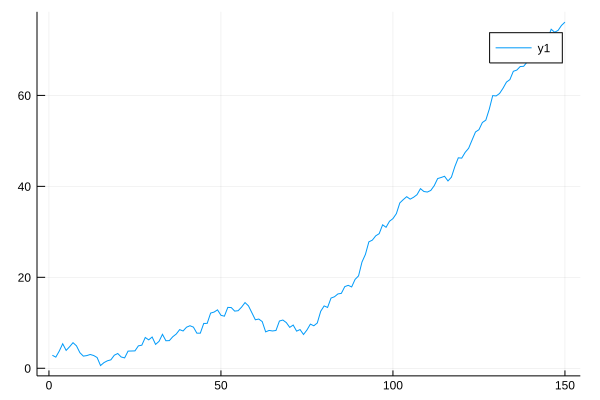

In [4]:
plot(y_simulated[burn_in + 1:end, 1])

In [5]:
# Complete Monte-Carlo simulation with 1000 draws
for s = 1 : number_of_simulations
    for t = 2 : burn_in + number_of_observations
        if t < burn_in + 75
            y_simulated[t] = theta * y_simulated[t - 1] + error_terms[t, s]
        else
            y_simulated[t] = coefficient_break + theta * y_simulated[t - 1] + error_terms[t, s]
        end
    end
    dickey_fuller_pvalues[s] = pvalue(ADFTest(y_simulated[burn_in + 1:end, 1], :constant, 0))
end

In [6]:
decision_vector = dickey_fuller_pvalues .< 0.05
rejection_frequency = mean(decision_vector)

0.0